# Analyses of extremes

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import sys
import os
import seaborn as sns
from scipy.stats import linregress
from scipy import stats
from dask import delayed
from IPython.display import display, HTML
import imageio
#from joblib import Parallel, delayed
import matplotlib.dates as mdates
import intake
from DV8_extremes import *
#DV8_functions(1) packages
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.animation import FFMpegWriter
from matplotlib import animation, rc
from IPython.display import HTML
#my functions:


import matplotlib.colors as mcolors

from tempfile import TemporaryDirectory
from getpass import getuser
from pathlib import Path
import dask
from dask.distributed import Client, LocalCluster
import bokeh
import subprocess
import re

import warnings
#warnings.filterwarnings('ignore')
scratch_dir = Path('/scratch') / getuser()[0] / getuser()

In [2]:


dask.config.config.get('distributed').get('dashboard').update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'})
cluster = LocalCluster(n_workers=32,threads_per_worker=1)
client = Client(cluster)
client

/home/b/b382616/.local/lib/python3.10/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36765 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/b382616/levante-spawner-preset//proxy/36765/status,
Dashboard: /user/b382616/levante-spawner-preset//proxy/36765/status,Workers: 32
Total threads: 32,Total memory: 235.37 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33821,Workers: 32
Dashboard: /user/b382616/levante-spawner-preset//proxy/36765/status,Total threads: 32
Started: Just now,Total memory: 235.37 GiB
Comm: tcp://127.0.0.1:45889,Total threads: 1
Dashboard: /user/b382616/levante-spawner-preset//proxy/37931/status,Memory: 7.36 GiB
Nanny: tcp://127.0.0.1:41195,


2025-11-24 16:22:26,953 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 19c9e9ef0def6e45d96c9c0f407d3dab initialized by task ('getitem-open_dataset-rechunk-transfer-489e65fb5851fd96c545a0a2279d05f4', 0, 0, 0, 9, 0, 0) executed on worker tcp://127.0.0.1:34039
2025-11-24 16:22:33,204 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 676de6f04b3de2aed6a3889ccb792de8 initialized by task ('rechunk-merge-where-rechunk-transfer-7900890941ab659e796ceab52fcff182', 0, 0, 0, 30, 0, 0) executed on worker tcp://127.0.0.1:37219
2025-11-24 16:24:20,789 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 676de6f04b3de2aed6a3889ccb792de8 deactivated due to stimulus 'task-finished-1763997860.787719'
2025-11-24 16:24:22,341 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 19c9e9ef0def6e45d96c9c0f407d3dab deactivated due to stimulus 'task-finished-1763997862.340085'
2025-11-24 16:25:00,150 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle e39bf0872b04130f

# LOAD DATA
### Only take latitudes between 50°S and 70°N, to retain only ice-free oceans. To make sure no sea ice appears in these latitudes we apply SSTA=SSTA.where(sst>-1.7) for all anomalies. Gridcells with sea ice are defined in OSTIA,ICON and IFS-FESOM as an SST value of ~-1.75, by applying the where condition we make sure to only take ice free times and grid-cells without throwing out entire areas, but only the times and places where sea ice appears.
### Convert ICON and IFS-FESOM longitudes from 0->360 to -180->180

In [3]:

def lon_180w_180e(ds_sice: xr.DataArray):
    ds_sice = (
        ds_sice
        .assign_coords(lon=lambda x: (x.lon - 180) % 360 - 180)
        .sortby('lon'))

    return ds_sice

In [4]:
#SST

# OSTIA
filename='/scratch/b/b382615/mhws/ostia.zarr' 
sst = xr.open_zarr(str(filename), chunks={'time':150, 'lat':-1, 'lon':-1}).sst
sst=sst.sel(lat=slice(-50, 70))
sst=sst-273.15

# ICON HISTORICAL
cat = intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")
dat = cat['dkrz.disk.model-output.icon-esm-er.hist-1950.v20240618.ocean.gr025']
sst_ic = dat['2d_daily_mean'](chunks={}).to_dask().to.isel(depth=0).drop_vars('depth').chunk({'time':150, 'lat':-1, 'lon':-1})
sst_ic=sst_ic.sel(lat=slice(-50, 70))


# IFS FESOM
cat = intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")
dat = cat['dkrz.disk.model-output.ifs-fesom2-sr.hist-1950.v20240304.ocean.gr025']#.icon-esm-er.hist-1950.v20240618.ocean.gr025']
sst_f = dat['2D_daily_avg_1950-2014'].to_dask().avg_tos.isel(depth=0).drop_vars('depth').chunk({'time':150, 'lat':-1, 'lon':-1})
sst_f=sst_f.sel(lat=slice(-50, 70))
            


## SHIFTING BASELINE

In [5]:
##OSTIA extremes shifting baseline

#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_shift_hob_maxanom5.zarr'

#chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#ds = xr.open_zarr(str(file_name), chunks=chunks)
#ds = ds.sel(lat=slice(-50, 70))
#o_ex_s=ds['extreme_events']
#sst=sst.sel(time=slice((o_ex_s.time[0].values),str(o_ex_s.time[-1].values)))





##ICON HIST extremes shifting baseline

#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_shift_hob_maxanom5_oct25.zarr'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#i_ds = xr.open_zarr(str(file_name), chunks=chunks)
#i_ds=lon_180w_180e(i_ds)
#i_ds = i_ds.sel(lat=slice(-50, 70))
#i_ex_s=i_ds['extreme_events']
#sst_ic=sst_ic.sel(time=slice(str(i_ex_f.time[0].values),str(i_ex_f.time[-1].values)))
#i_ex_float = i_ex_s.astype(float)  # Convert to 0.0 and 1.0
#i_ex_s = i_ex_float > 0.5  # Convert back to boolean if needed




##IFS-FESOM extremes shifting baseline

#file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IFSFESOMhist_pre_1982_2014_shift_hob_maxanom5_oct25.zarr'
#chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
#f_ds = xr.open_zarr(str(file_name), chunks=chunks)
#f_ds=lon_180w_180e(f_ds)
#f_ds = f_ds.sel(lat=slice(-50, 70))
#f_ex_s=f_ds['extreme_events']
#fssta=f_ds['dat_anomaly']
#f_ex_float = f_ex_s.astype(float) 
#f_ex_s = f_ex_float > 0.5  # Convert back to boolean if needed



## FIXED BASELINE

In [6]:
# FIXED BASELINES

# OSTIA EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_FixedDetrend_hob_oct25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds = xr.open_zarr(str(file_name), chunks=chunks)
ds = ds.sel(lat=slice(-50, 70))
o_ex=ds['extreme_events']
sst=sst.sel(time=slice((o_ex.time[0].values),str(o_ex.time[-1].values)))



In [7]:

# ICON HIST EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
i_ds = xr.open_zarr(str(file_name), chunks=chunks)
i_ds=lon_180w_180e(i_ds)
i_ds = i_ds.sel(lat=slice(-50, 70))
i_ex=i_ds['extreme_events']
sst_ic=sst_ic.sel(time=slice(str(i_ex.time[0].values),str(i_ex.time[-1].values)))


# For extreme events (boolean)
i_ex_float = i_ex.astype(float)  # Convert to 0.0 and 1.0
#i_ex_interp = i_ex_float.interp(lat=o_ex.lat, lon=o_ex.lon)
i_ex = i_ex_float > 0.5  # Convert back to boolean if needed





# IFS-FESOM EXTREMES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
f_ds = xr.open_zarr(str(file_name), chunks=chunks)
f_ds=lon_180w_180e(f_ds)
f_ds = f_ds.sel(lat=slice(-50, 70))
f_ex=f_ds['extreme_events']
fssta=f_ds['dat_anomaly']
#sst_f=sst_f.sel(time=slice((fssta.time[0].values),str(fssta.time[-1].values)))
# For extreme events (boolean)
f_ex_float = f_ex.astype(float)  # Convert to 0.0 and 1.0
#f_ex_interp = f_ex_float.interp(lat=o_ex.lat, lon=o_ex.lon)
f_ex = f_ex_float > 0.5  # Convert back to boolean if needed



In [8]:
# SST ANOMALIES
# FIXED BASELINES


# FIXED BASELINES

# OSTIA ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_FixedDetrend_hob_oct25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds = xr.open_zarr(str(file_name), chunks=chunks)
ds = ds.sel(lat=slice(-50, 70))
ossta=ds['dat_anomaly']
sst=sst.sel(time=slice((ossta.time[0].values),str(ossta.time[-1].values))) #making sure SST time matches SSTA time before masking the sea ice
ossta=ossta.where(sst>-1.7) #remove from anomalies places and times where there is sea ice



# ICON HIST ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
i_ds = xr.open_zarr(str(file_name), chunks=chunks)
i_ds=lon_180w_180e(i_ds)
sst_ic=lon_180w_180e(sst_ic)
i_ds = i_ds.sel(lat=slice(-50, 70))
issta=i_ds['dat_anomaly']
sst_ic=sst_ic.sel(time=slice(str(issta.time[0].values),str(issta.time[-1].values)))
# Now apply the sea ice mask
issta = issta.where(sst_ic > -1.7)



# IFS-FESOM ANOMALIES
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
f_ds = xr.open_zarr(str(file_name), chunks=chunks)
f_ds=lon_180w_180e(f_ds)
sst_f=lon_180w_180e(sst_f)
f_ds = f_ds.sel(lat=slice(-50, 70))
fssta=f_ds['dat_anomaly']
sst_f=sst_f.sel(time=slice((fssta.time[0].values),str(fssta.time[-1].values)))
# Now apply the sea ice mask
fssta = fssta.where(sst_f > -1.7)


# Regional masks
Create regional masks based on SST variance relevance. You have to download the oceanic regions from the shapefile at

Flanders Marine Institute (2021). Global Oceans and Seas, version 1. Available online at https://www.marineregions.org/. https://doi.org/10.14284/542.


Put this file in the same place as your shapefile_path. This file is then heavily modified to  adapt it to the wanted regions.

The 'create_oceanic_regions_mask' function needs a one-time slice of global sst to work.

You have to provide an example_sst for each model (if they have different grids) for the oceanic regions masks to be created: Any single time slice of lat and lon will work.

if you don't specify it in the funbction call here,i.e.:

masks = create_oceanic_regions_mask(lats, lons,example_sst=something, method='shapefile')

then it's going to look for it in the same path where I saved my shapefile.

This is what I did:

In [ ]:
# CREATE EXAMPLE SST SLICES FOR MASK CREATION

##Save it to wherever the function create_shapefile_oceanic_regions_mask points to


# ICON HIST EXAMPLE SST
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'ICONhist_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
i_ds = xr.open_zarr(str(file_name), chunks=chunks)
i_ds=lon_180w_180e(i_ds)
issta=i_ds['dat_anomaly']
issta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_ICON.nc')





## IFS-FESOM EXAMPLE SST
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'IfsFesom_pre_1982_2014_FixedDetrend_hob_nov25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
f_ds = xr.open_zarr(str(file_name), chunks=chunks)
f_ds=lon_180w_180e(f_ds)
fssta=f_ds['dat_anomaly']
fssta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_IFSFESOM.nc')



##for OSTIA EXAMPLE SST
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'OSTIA_pre_1982_2014_FixedDetrend_hob_oct25.zarr'
chunks={'time': 400, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
o_ds = xr.open_zarr(str(file_name), chunks=chunks)
ossta=o_ds['dat_anomaly']
ossta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_OSTIA.nc')






In [7]:
#OSTIA
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'DV8' / 'example_sst_OSTIA.nc'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds_exmp = xr.open_dataset(str(file_name), chunks=chunks)
ds_exmp=ds_exmp.sel(lat=slice(-50, 70))

#ICON

#issta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_icon.nc')
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' /'DV8' /  'example_sst_ICON.nc'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds_exmp_ic = xr.open_dataset(str(file_name), chunks=chunks)
ds_exmp_ic=ds_exmp_ic.sel(lat=slice(-50, 70))


# IFS FESOM

#fssta.isel(time=0).to_netcdf('/home/b/b382616/scratch/mhws/DV8/example_sst_ifsfesom.nc')
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' /'DV8' /  'example_sst_IFSFESOM.nc'
chunks={'time': 150, 'lat': -1, 'lon': -1} #time=10 for 100GB #time=150 for 512GB
ds_exmp_f = xr.open_dataset(str(file_name), chunks=chunks)
ds_exmp_f=ds_exmp_f.sel(lat=slice(-50, 70))





### Create masks from saved example SST

In [7]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}

# 2. Create model-specific masks
masks_dict = create_model_specific_masks(models_dict)


# It will automatically search for:
# - /scratch/b/b382616/mhws/DV8/example_sst_OSTIA.nc
# - /scratch/b/b382616/mhws/DV8/example_sst_ICON.nc
# - /scratch/b/b382616/mhws/DV8/example_sst_IFS-FESOM.nc (and variations)


Creating model-specific masks...
Creating masks for OSTIA...
Creating masks from shapefile for model grid (480,) x (1440,)...
  Found model-specific example SST: /scratch/b/b382616/mhws/DV8/example_sst_OSTIA.nc
  Using model-specific example SST for OSTIA


ERROR 1: PROJ: internal_proj_create_from_database: /sw/spack-levante/mambaforge-22.9.0-2-Linux-x86_64-kptncg/share/proj/proj.db contains DATABASE.LAYOUT.VERSION.MINOR = 2 whereas a number >= 3 is expected. It comes from another PROJ installation.


  Creating Southern Ocean mask...
  Creating mask for North Pacific Ocean...
  Creating mask for South Pacific Ocean...
  Creating mask for North Atlantic Ocean...
  Creating mask for South Atlantic Ocean...
  Creating mask for Indian Ocean...
  Creating equatorial mask for Pacific...
  Creating equatorial mask for Atlantic...
  Creating equatorial mask for Indian...
  Creating mask for Mediterranean Region...
  Creating mask for Baltic Sea...
  Creating mask for South China and Easter Archipelagic Seas...
Applying region modifications...
Ensuring masks are mutually exclusive...
Total conflicts resolved: 0
Model-specific masks saved to /scratch/b/b382616/mhws/DV8/model_masks/ICON_481x1440_-2130404455801615551_region_masks.zarr
  ICON grid: (481,) x (1440,)
  ICON regions: ['Southern_Ocean', 'North_Pacific_SubTropics', 'North_Pacific_MiddleLats', 'South_Pacific_SubTropics', 'North_Atlantic_SubTropics', 'North_Atlantic_MiddleLats', 'South_Atlantic_SubTropics', 'Indian_SouthSubTropics', '

ERROR 1: PROJ: internal_proj_create_from_database: /sw/spack-levante/mambaforge-22.9.0-2-Linux-x86_64-kptncg/share/proj/proj.db contains DATABASE.LAYOUT.VERSION.MINOR = 2 whereas a number >= 3 is expected. It comes from another PROJ installation.


  Creating Southern Ocean mask...
  Creating mask for North Pacific Ocean...
  Creating mask for South Pacific Ocean...
  Creating mask for North Atlantic Ocean...
  Creating mask for South Atlantic Ocean...
  Creating mask for Indian Ocean...
  Creating equatorial mask for Pacific...
  Creating equatorial mask for Atlantic...
  Creating equatorial mask for Indian...
  Creating mask for Mediterranean Region...
  Creating mask for Baltic Sea...
  Creating mask for South China and Easter Archipelagic Seas...
Applying region modifications...
Ensuring masks are mutually exclusive...
Total conflicts resolved: 4415
Model-specific masks saved to /scratch/b/b382616/mhws/DV8/model_masks/IFS-FESOM_481x1440_-2130404455801615551_region_masks.zarr
  IFS-FESOM grid: (481,) x (1440,)
  IFS-FESOM regions: ['Southern_Ocean', 'North_Pacific_SubTropics', 'North_Pacific_MiddleLats', 'South_Pacific_SubTropics', 'North_Atlantic_SubTropics', 'North_Atlantic_MiddleLats', 'South_Atlantic_SubTropics', 'Indian_S

### Or explicitly Providing Example SSTs

In [ ]:
# Define example SSTs for each model

#models_sst_examples = {
#    'OSTIA': ds_exmp,      # Your OSTIA example SST
#    'ICON': ds_exmp_ic,    # Your ICON example SST
#    'IFS-FESOM': ds_exmp_f # Your IFS-FESOM example SST
#}


# Use them in mask creation

#masks_dict = create_model_specific_masks(
#    models_dict, 
#    models_example_sst=models_sst_examples
#)

### Plot masks

Creating model-specific masks...
Creating masks for OSTIA...
Creating masks from shapefile for model grid (480,) x (1440,)...
  Found model-specific example SST: /scratch/b/b382616/mhws/DV8/example_sst_OSTIA.nc
  Using model-specific example SST for OSTIA


ERROR 1: PROJ: internal_proj_create_from_database: /sw/spack-levante/mambaforge-22.9.0-2-Linux-x86_64-kptncg/share/proj/proj.db contains DATABASE.LAYOUT.VERSION.MINOR = 2 whereas a number >= 3 is expected. It comes from another PROJ installation.


  Creating Southern Ocean mask...
  Creating mask for North Pacific Ocean...
  Creating mask for South Pacific Ocean...
  Creating mask for North Atlantic Ocean...
  Creating mask for South Atlantic Ocean...
  Creating mask for Indian Ocean...
  Creating equatorial mask for Pacific...
  Creating equatorial mask for Atlantic...
  Creating equatorial mask for Indian...
  Creating mask for Mediterranean Region...
  Creating mask for Baltic Sea...
  Creating mask for South China and Easter Archipelagic Seas...
Applying region modifications...
Ensuring masks are mutually exclusive...
Total conflicts resolved: 0
Model-specific masks saved to /scratch/b/b382616/mhws/DV8/model_masks/model_480x1440_-6516536470952458378_region_masks.zarr
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Southern_Ocean', 'North_Pacific_SubTropics', 'North_Pacific_MiddleLats', 'South_Pacific_SubTropics', 'North_Atlantic_SubTropics', 'North_Atlantic_MiddleLats', 'South_Atlantic_SubTropics', 'Indian_SouthSubTropics'

ERROR 1: PROJ: internal_proj_create_from_database: /sw/spack-levante/mambaforge-22.9.0-2-Linux-x86_64-kptncg/share/proj/proj.db contains DATABASE.LAYOUT.VERSION.MINOR = 2 whereas a number >= 3 is expected. It comes from another PROJ installation.


  Creating Southern Ocean mask...
  Creating mask for North Pacific Ocean...
  Creating mask for South Pacific Ocean...
  Creating mask for North Atlantic Ocean...
  Creating mask for South Atlantic Ocean...
  Creating mask for Indian Ocean...
  Creating equatorial mask for Pacific...
  Creating equatorial mask for Atlantic...
  Creating equatorial mask for Indian...
  Creating mask for Mediterranean Region...
  Creating mask for Baltic Sea...
  Creating mask for South China and Easter Archipelagic Seas...
Applying region modifications...
Ensuring masks are mutually exclusive...
Total conflicts resolved: 4422
Model-specific masks saved to /scratch/b/b382616/mhws/DV8/model_masks/model_481x1440_-7070407536870561184_region_masks.zarr
  ICON grid: (481,) x (1440,)
  ICON regions: ['Southern_Ocean', 'North_Pacific_SubTropics', 'North_Pacific_MiddleLats', 'South_Pacific_SubTropics', 'North_Atlantic_SubTropics', 'North_Atlantic_MiddleLats', 'South_Atlantic_SubTropics', 'Indian_SouthSubTropics

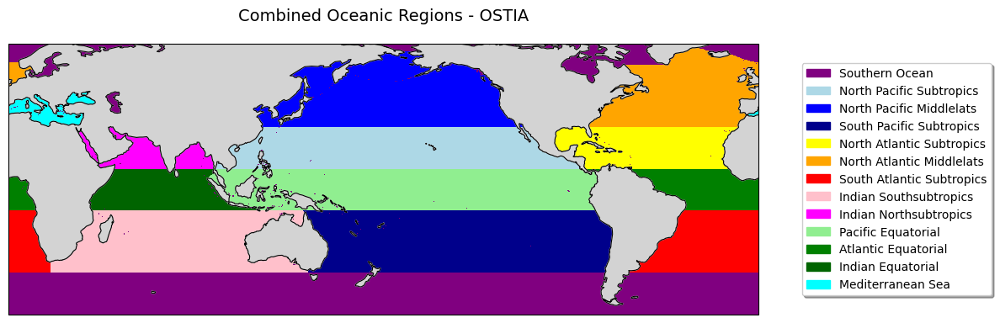

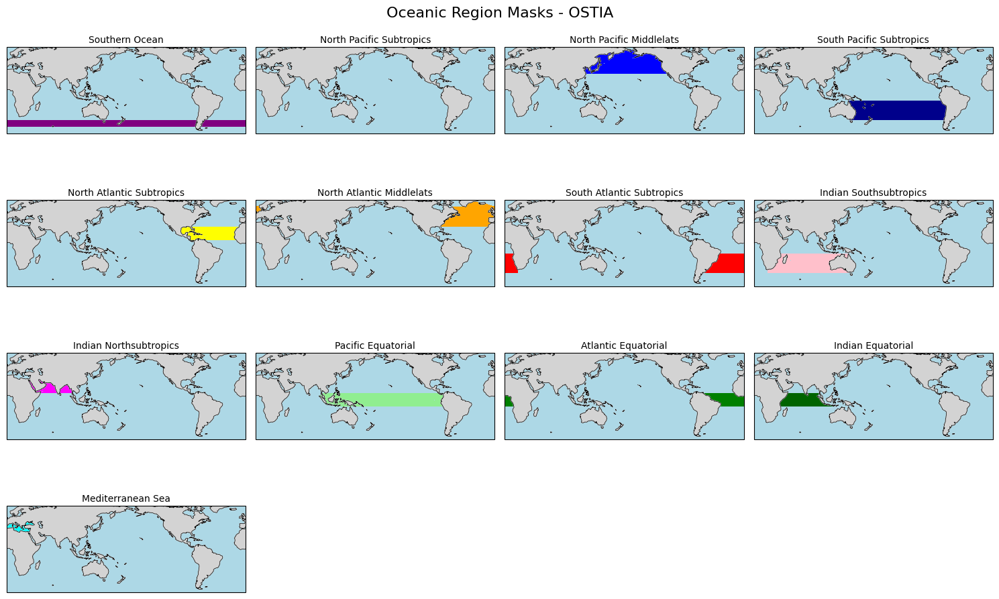

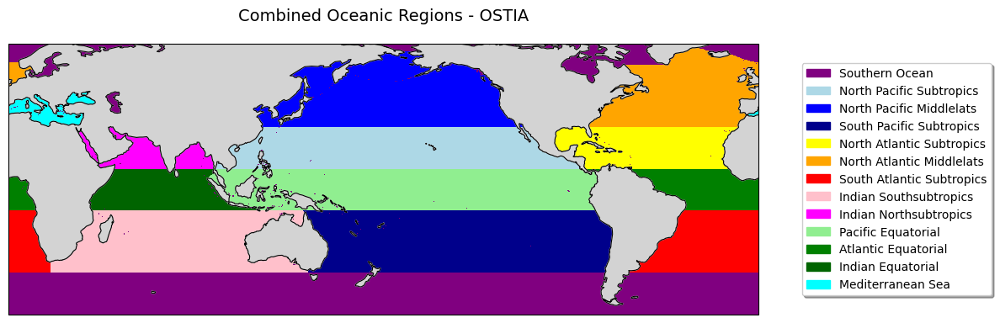

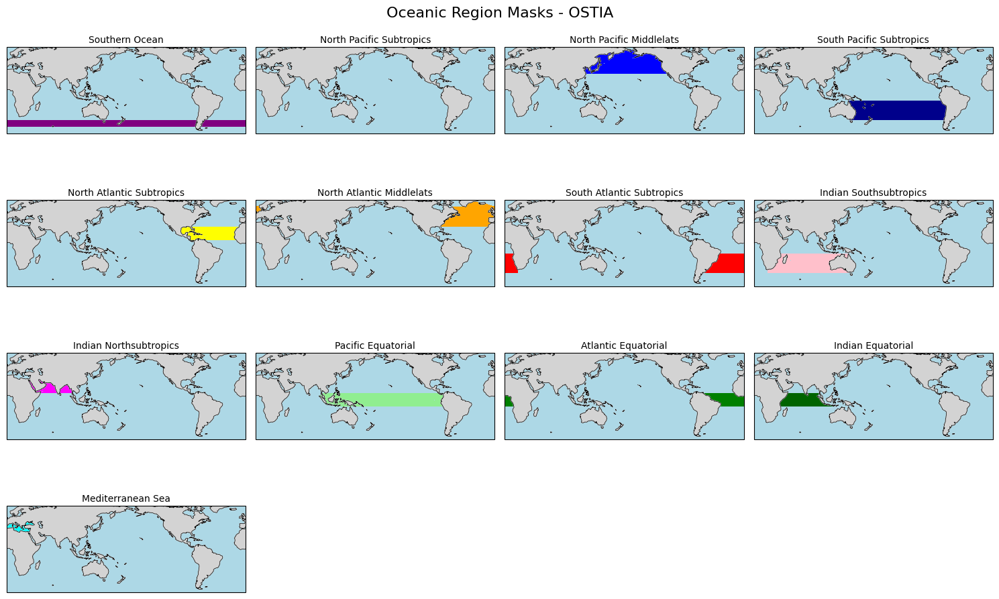


Visualizing OSTIA masks:
Visualizing masks for OSTIA


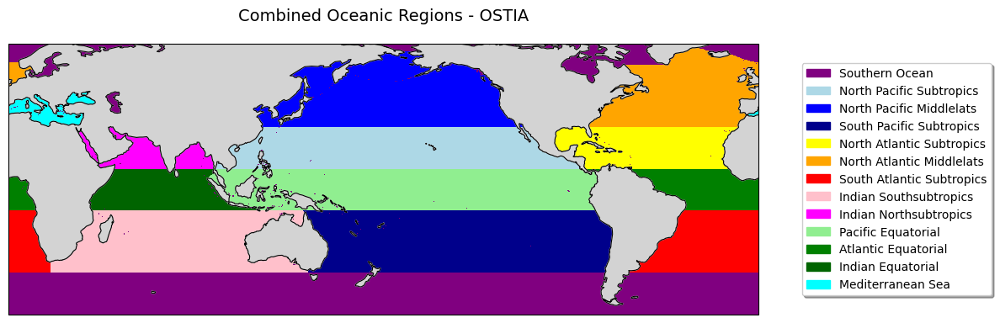

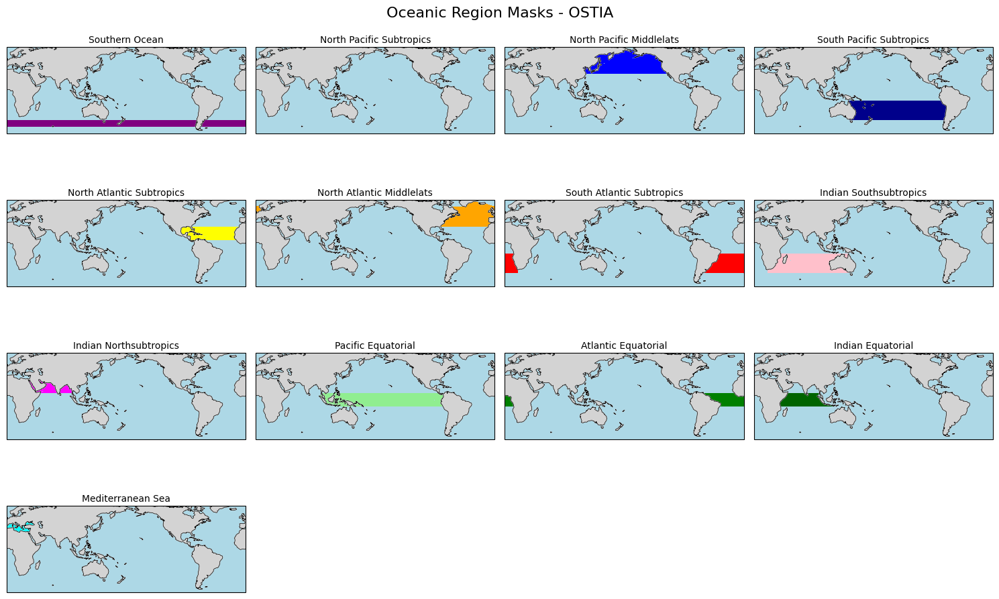


Visualizing ICON masks:
Visualizing masks for ICON


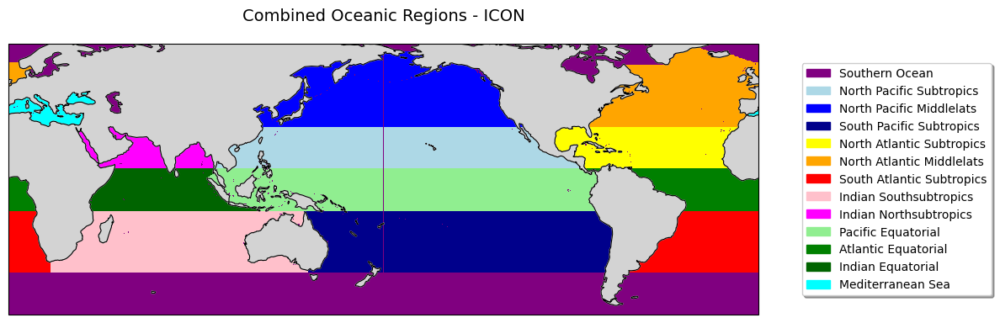

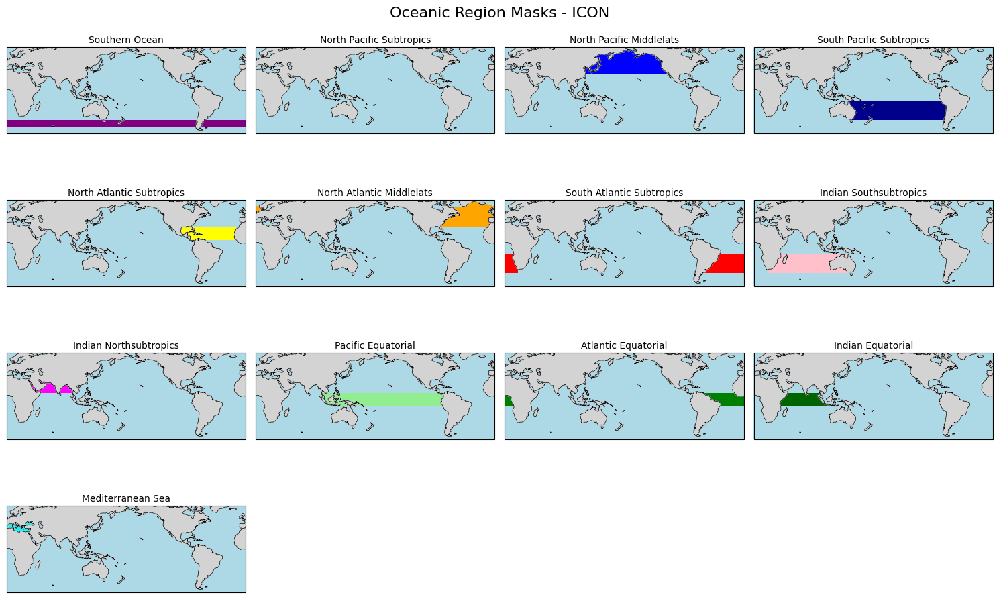


Visualizing IFS-FESOM masks:
Visualizing masks for IFS-FESOM


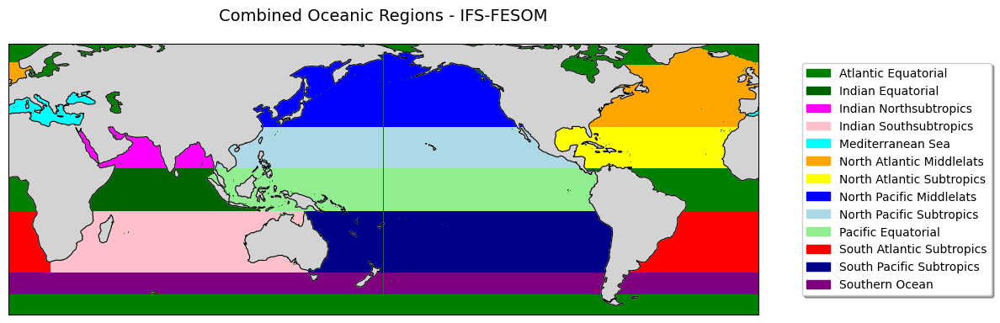

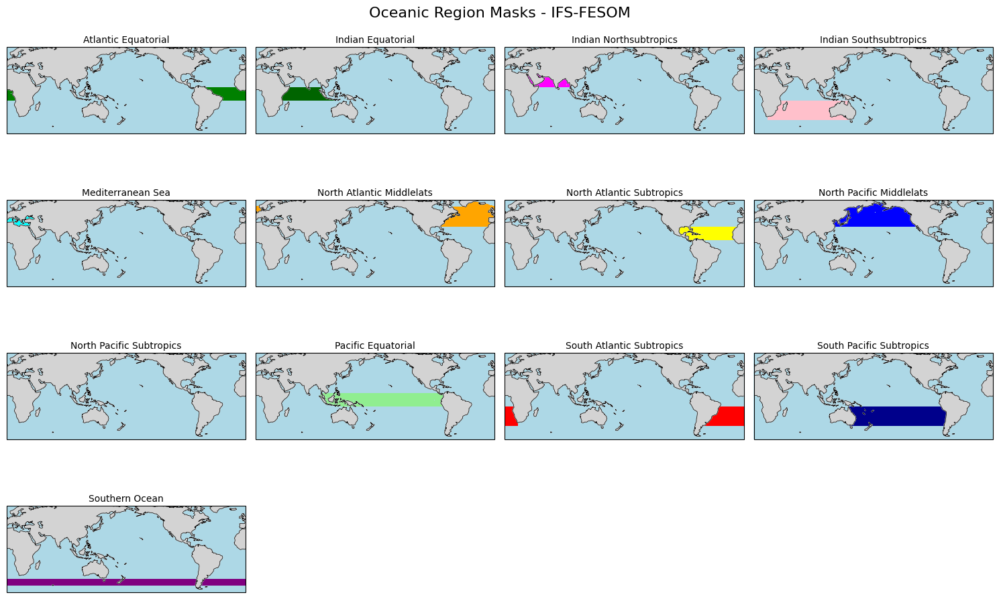

In [7]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


# After creating your masks dictionary
masks_dict = create_model_specific_masks(models_dict)

# Quick visualization for a specific model
quick_visualize_masks(masks_dict, 'OSTIA')

# Or do it step by step for more control:

# Plot combined regions map
fig_combined, ax_combined = plot_combined_regions_mask(masks_dict, 'OSTIA')
plt.show()

# Plot individual masks in subplots
fig_individual, axes_individual = plot_model_masks(masks_dict, 'OSTIA')
plt.show()

# Visualize for all models
for model_name in masks_dict.keys():
    print(f"\nVisualizing {model_name} masks:")
    quick_visualize_masks(masks_dict, model_name)

# EXTREMES

In [7]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


=== REGIONAL EXTREMES ANALYSIS - BARCHART ===
QUICK REGIONAL EXTREMES ANALYSIS WITH MODEL-SPECIFIC MASKS
COMPUTING REGIONAL EXTREMES WITH MODEL-SPECIFIC MASKS
Creating model-specific masks...
Creating masks for OSTIA...
Creating masks from shapefile for model grid (480,) x (1440,)...
  Found model-specific example SST: /scratch/b/b382616/mhws/DV8/example_sst_OSTIA.nc
  Using model-specific example SST for OSTIA


ERROR 1: PROJ: internal_proj_create_from_database: /sw/spack-levante/mambaforge-22.9.0-2-Linux-x86_64-kptncg/share/proj/proj.db contains DATABASE.LAYOUT.VERSION.MINOR = 2 whereas a number >= 3 is expected. It comes from another PROJ installation.


  Creating Southern Ocean mask...
  Creating mask for North Pacific Ocean...
  Creating mask for South Pacific Ocean...
  Creating mask for North Atlantic Ocean...
  Creating mask for South Atlantic Ocean...
  Creating mask for Indian Ocean...
  Creating equatorial mask for Pacific...
  Creating equatorial mask for Atlantic...
  Creating equatorial mask for Indian...
  Creating mask for Mediterranean Region...
  Creating mask for Baltic Sea...
  Creating mask for South China and Easter Archipelagic Seas...
Applying region modifications...
Ensuring masks are mutually exclusive...
Total conflicts resolved: 0
Model-specific masks saved to /scratch/b/b382616/mhws/DV8/model_masks/model_480x1440_7013901804586415446_region_masks.zarr
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Southern_Ocean', 'North_Pacific_SubTropics', 'North_Pacific_MiddleLats', 'South_Pacific_SubTropics', 'North_Atlantic_SubTropics', 'North_Atlantic_MiddleLats', 'South_Atlantic_SubTropics', 'Indian_SouthSubTropics',

ERROR 1: PROJ: internal_proj_create_from_database: /sw/spack-levante/mambaforge-22.9.0-2-Linux-x86_64-kptncg/share/proj/proj.db contains DATABASE.LAYOUT.VERSION.MINOR = 2 whereas a number >= 3 is expected. It comes from another PROJ installation.


  Creating Southern Ocean mask...
  Creating mask for North Pacific Ocean...
  Creating mask for South Pacific Ocean...
  Creating mask for North Atlantic Ocean...
  Creating mask for South Atlantic Ocean...
  Creating mask for Indian Ocean...
  Creating equatorial mask for Pacific...
  Creating equatorial mask for Atlantic...
  Creating equatorial mask for Indian...
  Creating mask for Mediterranean Region...
  Creating mask for Baltic Sea...
  Creating mask for South China and Easter Archipelagic Seas...
Applying region modifications...
Ensuring masks are mutually exclusive...
Total conflicts resolved: 4422
Model-specific masks saved to /scratch/b/b382616/mhws/DV8/model_masks/model_481x1440_-4399053962829283562_region_masks.zarr
  ICON grid: (481,) x (1440,)
  ICON regions: ['Southern_Ocean', 'North_Pacific_SubTropics', 'North_Pacific_MiddleLats', 'South_Pacific_SubTropics', 'North_Atlantic_SubTropics', 'North_Atlantic_MiddleLats', 'South_Atlantic_SubTropics', 'Indian_SouthSubTropics

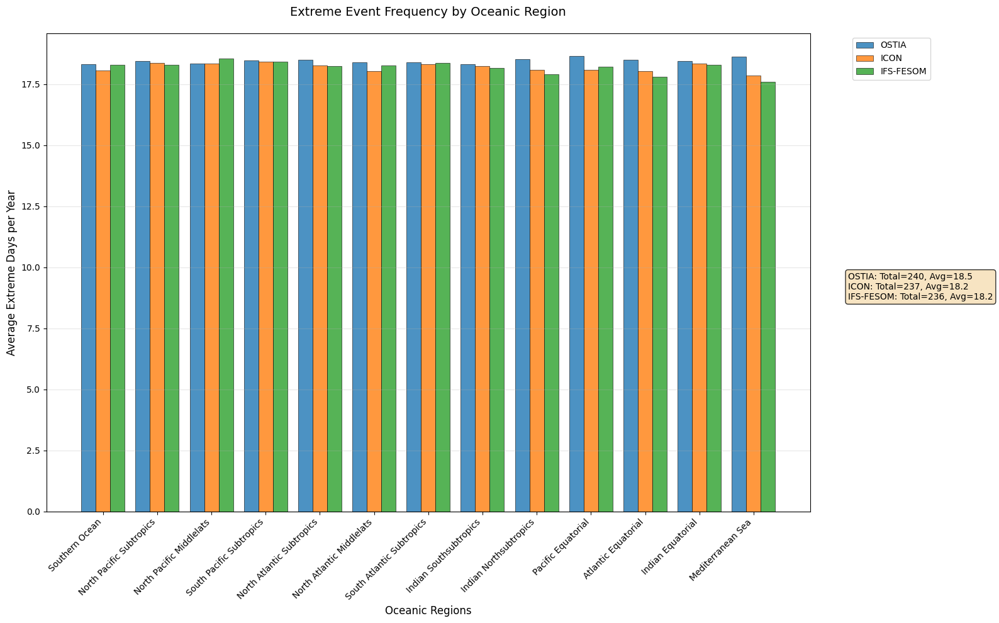

In [8]:
# Run the regional extremes analysis with different plot types

# Option A: Barchart (best for comparing models)
print("=== REGIONAL EXTREMES ANALYSIS - BARCHART ===")
fig_barchart, ax_barchart, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='barchart',
    per_grid_cell=True,    # Normalize by grid cell count
    normalize=True,        # Normalize by years to get days/year
    title="Extreme Event Frequency by Oceanic Region"
)
plt.show()

=== REGIONAL EXTREMES ANALYSIS - BARCHART ===
QUICK REGIONAL EXTREMES ANALYSIS WITH MODEL-SPECIFIC MASKS
COMPUTING REGIONAL EXTREMES WITH MODEL-SPECIFIC MASKS
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pac

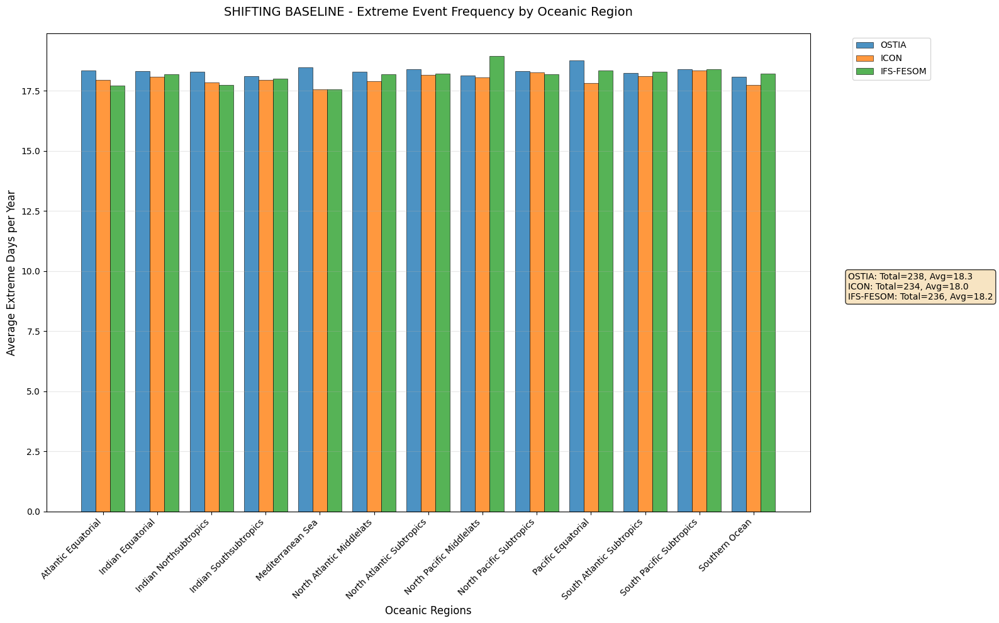

In [10]:
# 1. Define your models dictionary with extreme events data
models_dict = {
    'OSTIA': o_ex_s,      # Your OSTIA extreme events data
    'ICON': i_ex_s,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex_s   # Your IFS-FESOM extreme events data
}


# Run the regional extremes analysis with different plot types

# Option A: Barchart (best for comparing models)
print("=== REGIONAL EXTREMES ANALYSIS - BARCHART ===")
fig_barchart, ax_barchart, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='barchart',
    per_grid_cell=True,    # Normalize by grid cell count
    normalize=True,        # Normalize by years to get days/year
    title="SHIFTING BASELINE - Extreme Event Frequency by Oceanic Region"
)
plt.show()


=== REGIONAL EXTREMES ANALYSIS - HEATMAP ===
QUICK REGIONAL EXTREMES ANALYSIS WITH MODEL-SPECIFIC MASKS
COMPUTING REGIONAL EXTREMES WITH MODEL-SPECIFIC MASKS
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean']
Creating masks for ICON...
Loading existing masks for model grid (481,) x (1440,)...
  ICON grid: (481,) x (1440,)
  ICON regions: ['Atlantic_Equatorial', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pac

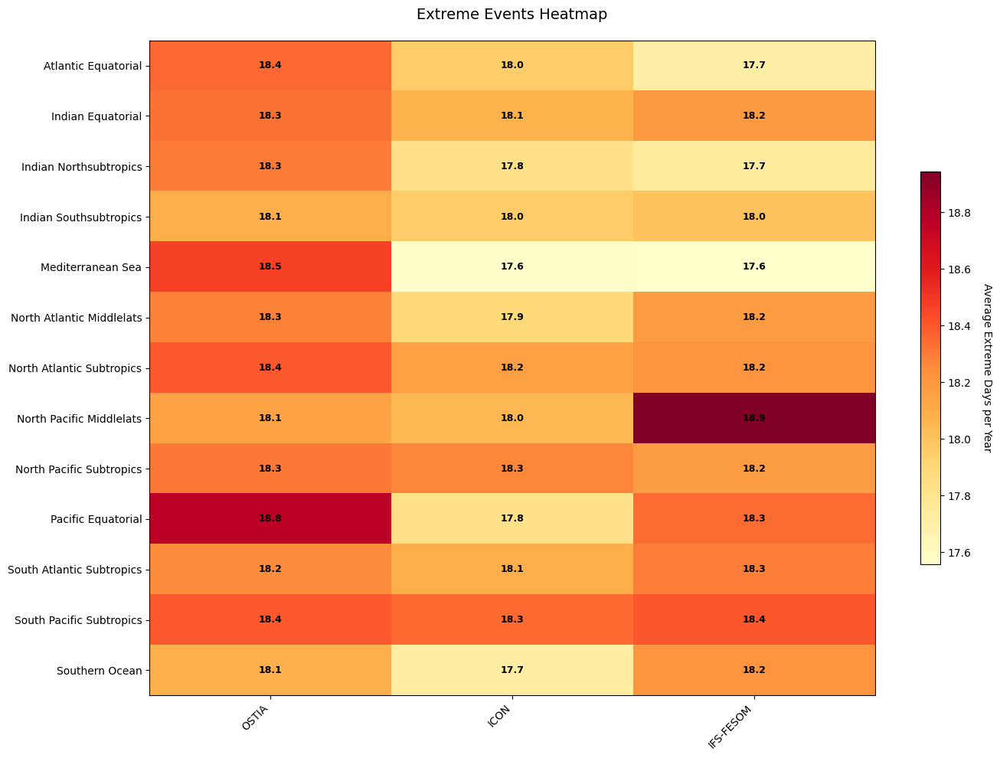

In [11]:
# Option B: Heatmap (good for detailed comparisons)
print("\n=== REGIONAL EXTREMES ANALYSIS - HEATMAP ===")
fig_heatmap, ax_heatmap, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='heatmap',
    per_grid_cell=True,
    normalize=True,
    title="Extreme Events Heatmap"
)
plt.show()



In [ ]:
# Option C: Single model view
print("\n=== REGIONAL EXTREMES ANALYSIS - SINGLE MODEL ===")
fig_single, ax_single, regional_data = quick_regional_extremes_analysis(
    models_dict,
    plot_type='single',
    per_grid_cell=True,
    normalize=True,
    title_template="{} - Regional Extreme Events"
)
plt.show()

# MHW EVENTS

In [9]:
o_ex=o_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})


In [10]:
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


In [14]:
# 1. Compute MHW events for all models
mhw_events_dict = compute_mhw_events_for_models(
    models_dict,
    min_duration=5,      # Minimum event duration in days
    max_gap=2,           # Maximum gap between events to merge
    max_events_per_cell=1000
)



COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846317
  Average duration: 14.0 days


QUICK MHW EVENTS ANALYSIS
COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846317
  Average duration: 14.0 days
Creating model-specific masks...
Creating masks for OSTIA...
Creating masks from shapefile for model grid (480,) x (1440,)...
  Found model-specific example SST: /scratch/b/b382616/mhws/DV8/example_sst_OSTIA.nc
  Using model-specific example SST for OSTIA
  Creating Southern Ocean mask...
  Creating mask for North Pacific Ocean...
  Creating mask for South Pacific Ocean...
  Creating mask for North Atlantic Ocean...
  Creating mask for South Atlantic Ocean...
  Creating mask for Indian Ocean...
  Creating equatorial mask for Pacific...
  Creating equatorial mask for Atlantic...
  Creating equatorial mask for Indi

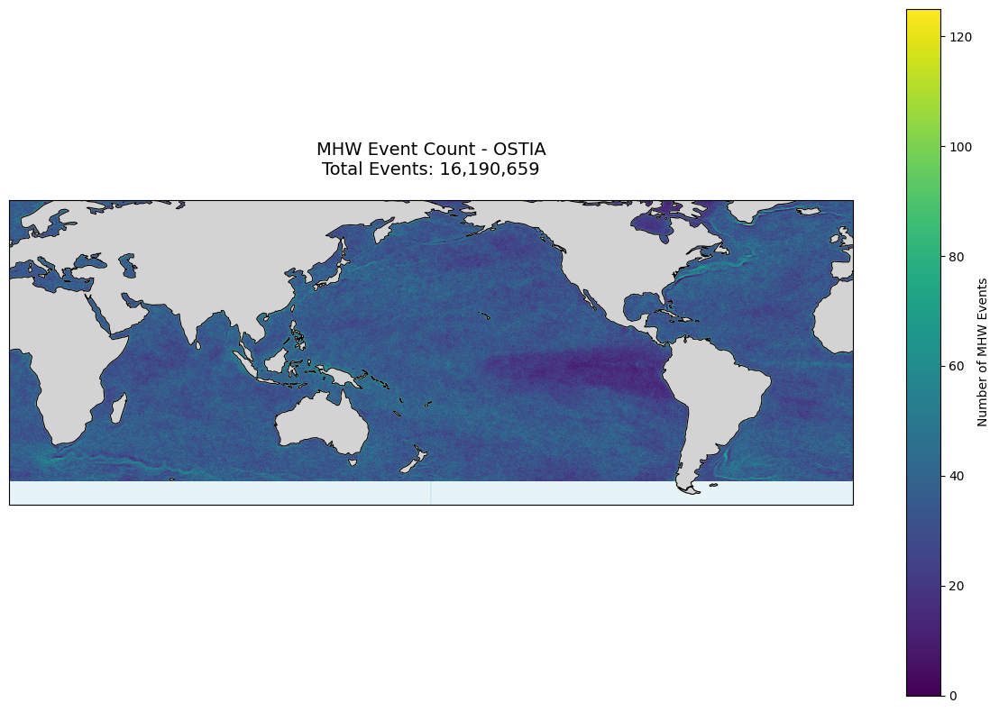

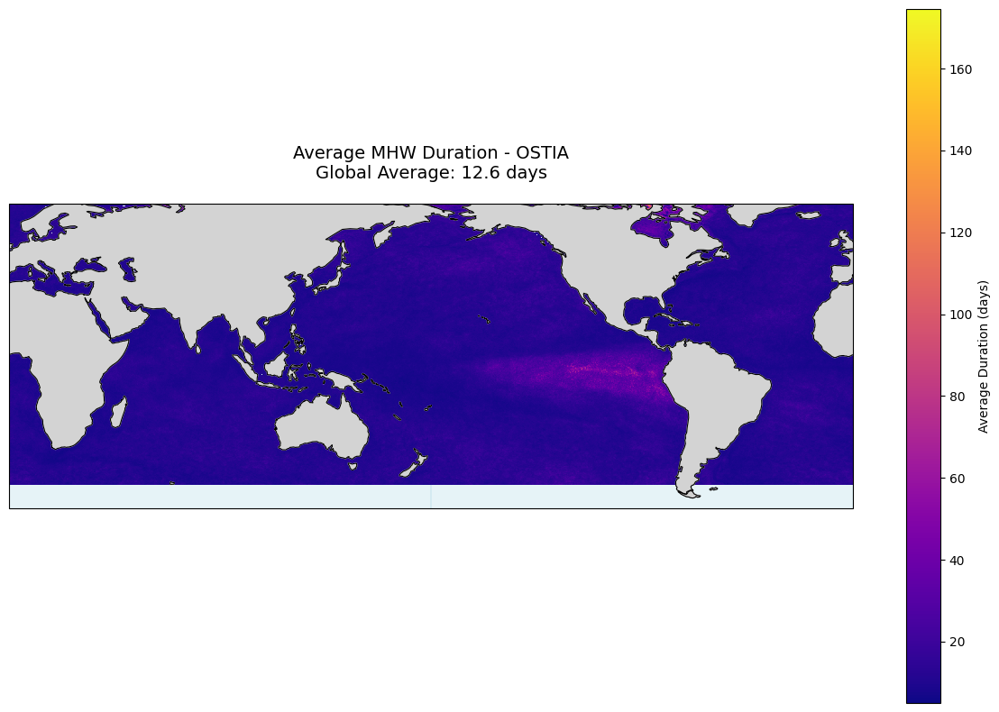

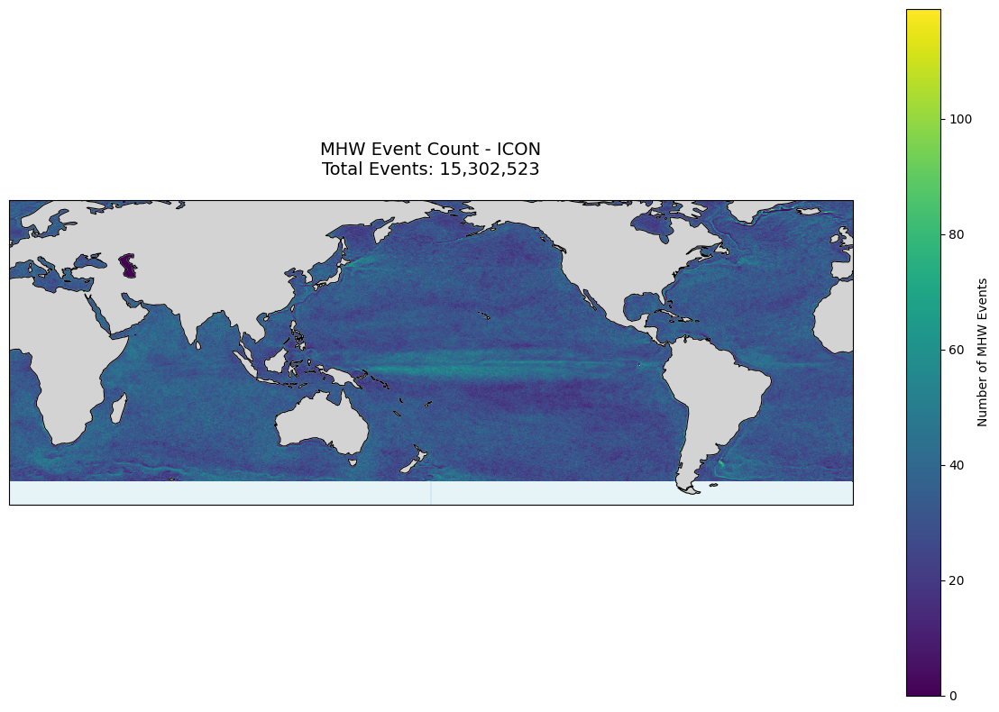

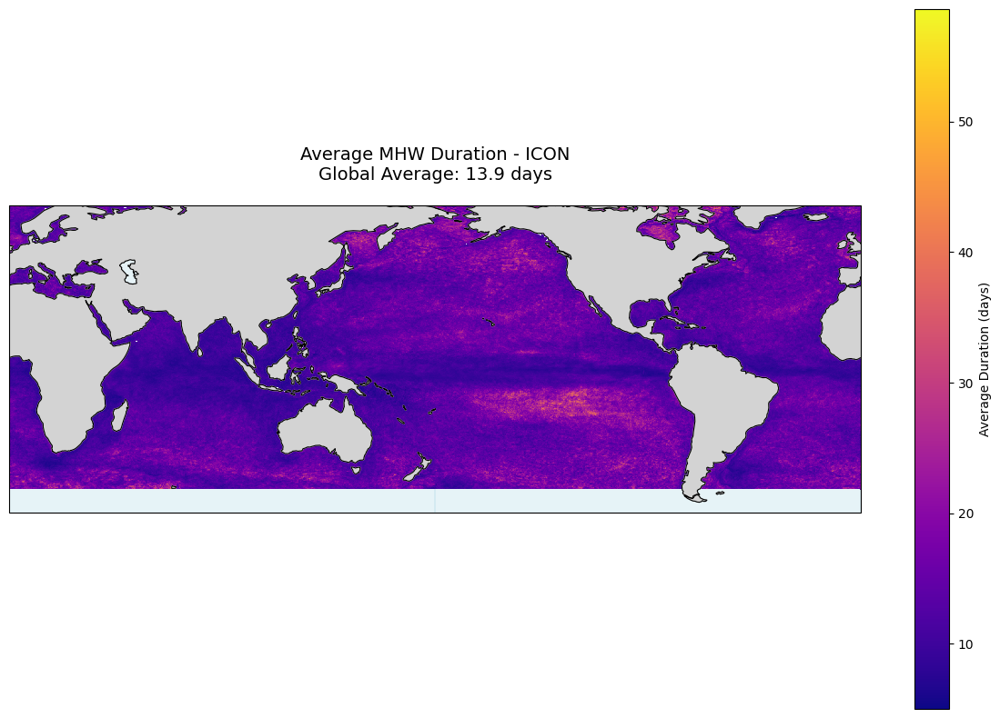

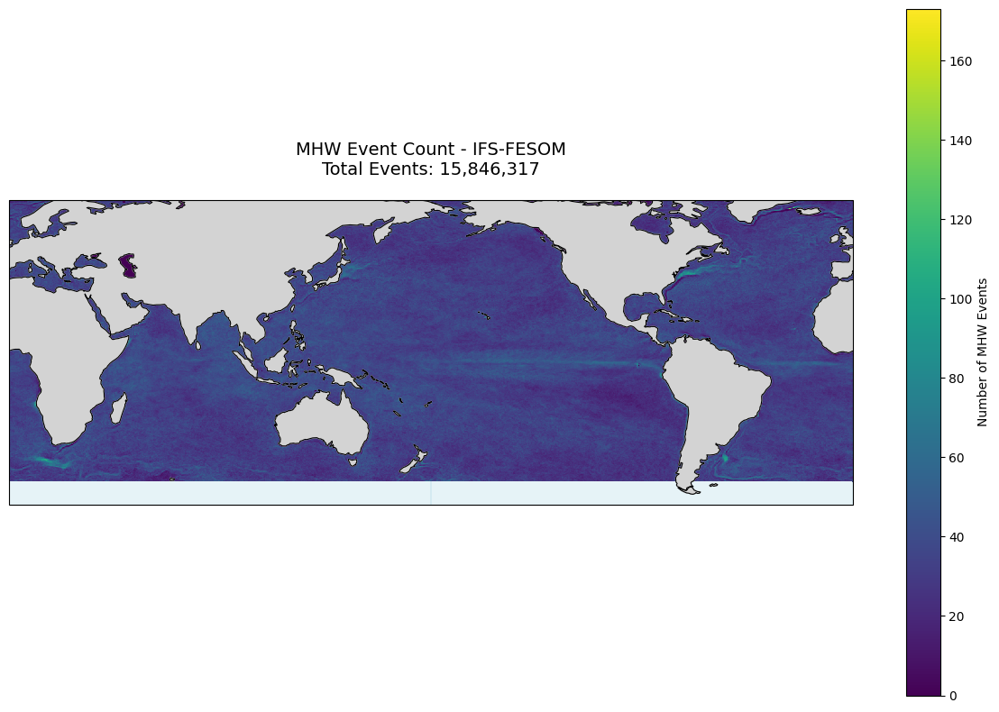

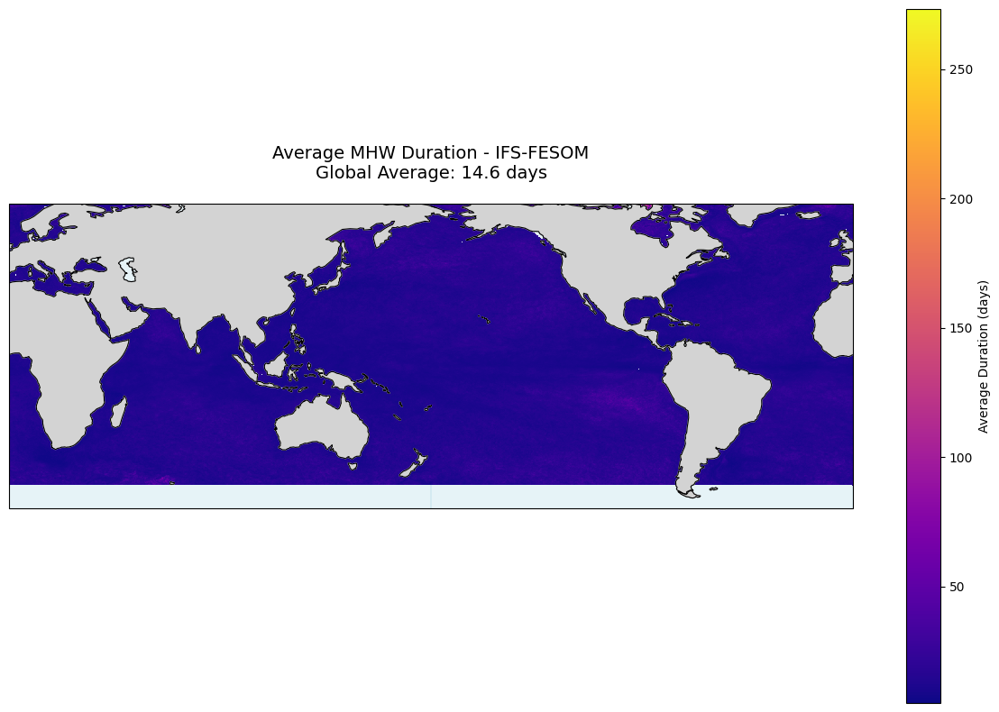


CREATING REGIONAL COMPARISONS...
PLOTTING REGIONAL MHW EVENT_COUNT BARCHART


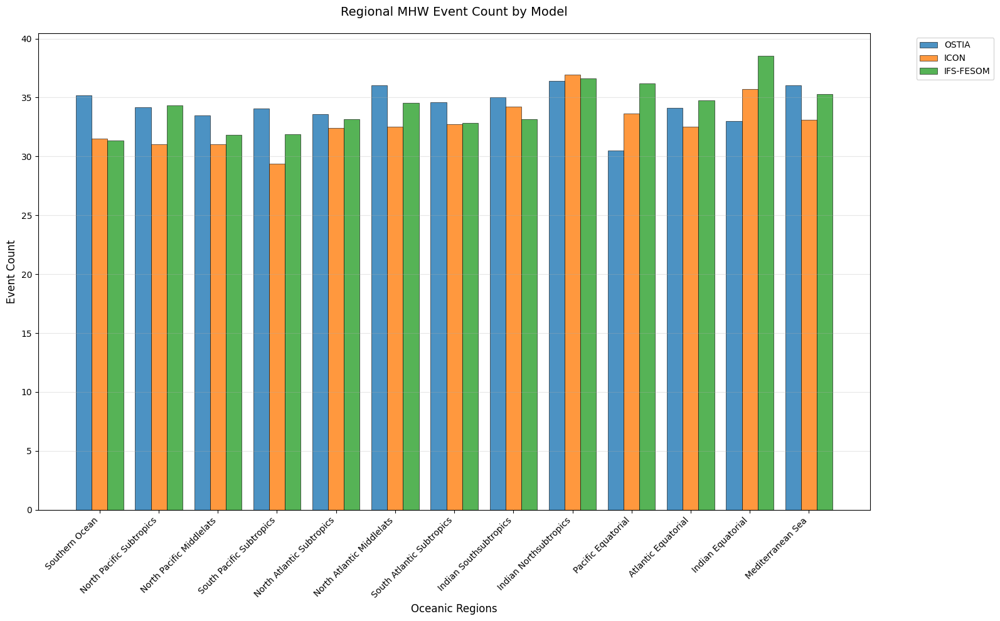

PLOTTING REGIONAL MHW TOTAL_EVENT_DAYS BARCHART


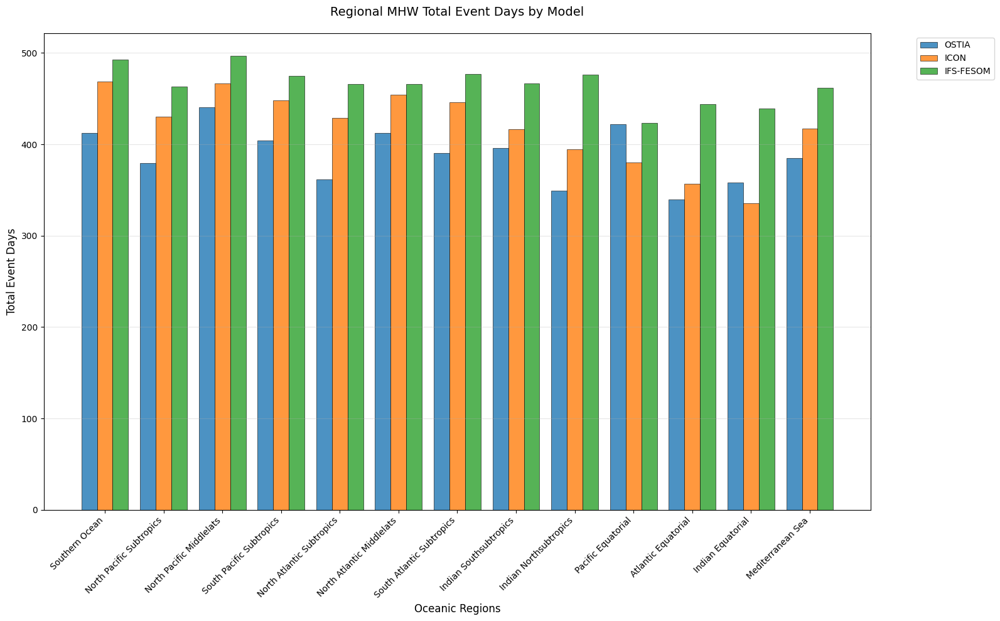

PLOTTING REGIONAL MHW AVG_DURATION BARCHART


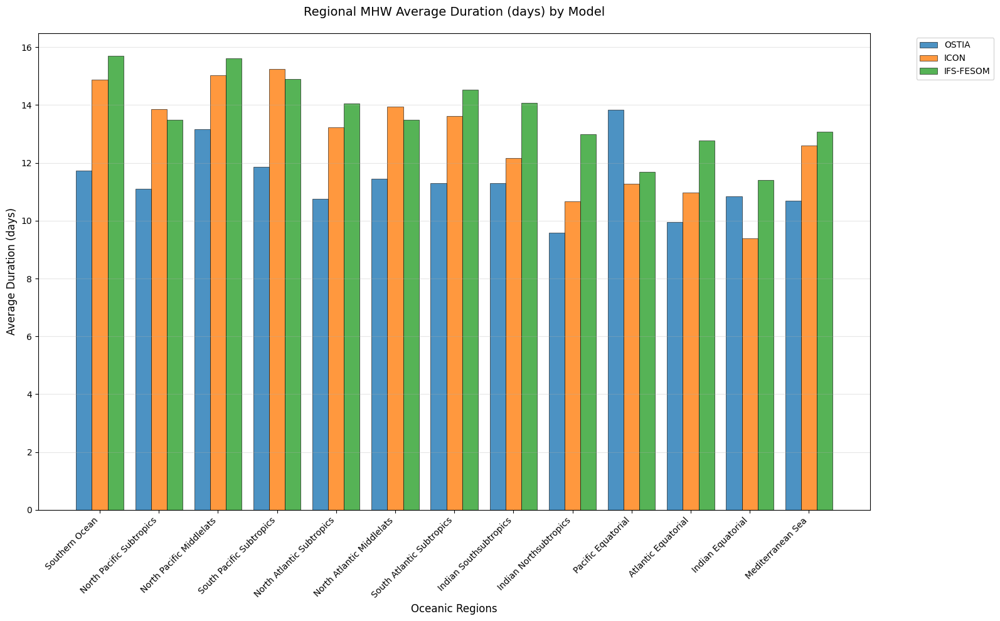

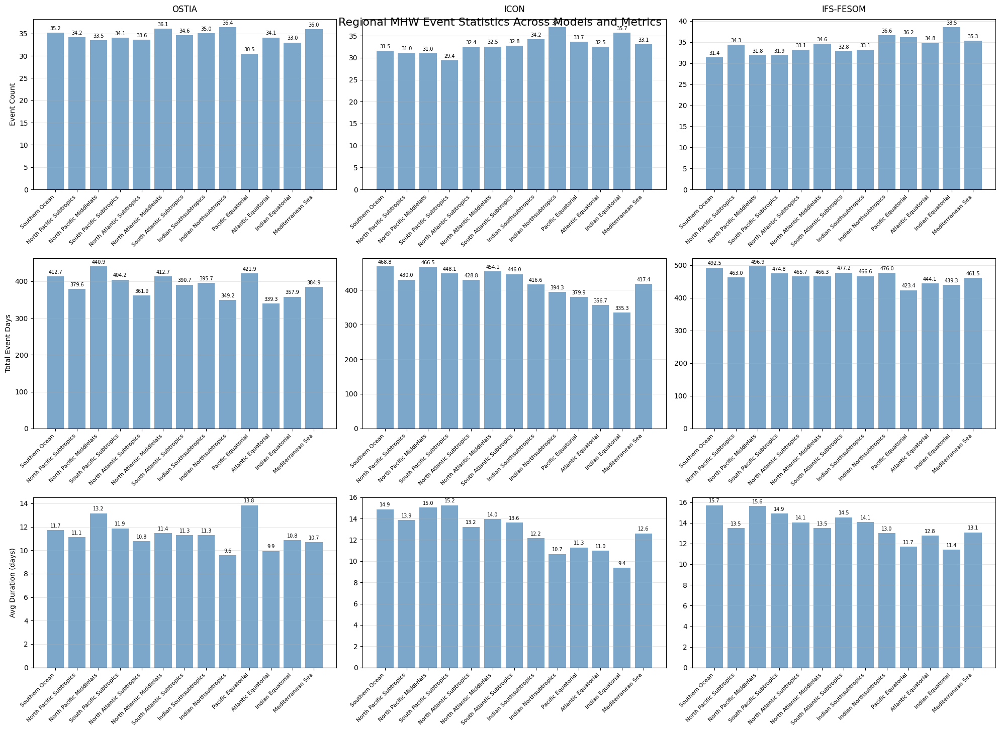

In [15]:


# Or use the quick analysis function
mhw_events_dict, regional_mhw_data, masks_dict = quick_mhw_events_analysis(
    models_dict,
    min_duration=5,
    max_gap=2,
    plot_maps=True,    # This will show maps automatically
    plot_regional=True # This will show regional comparisons automatically
)

## to pick wich graphs

In [10]:
models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


SELECTIVE MHW ANALYSIS - SHOWING ONLY SPECIFIED PLOTS
Plots to show: ['regional_summary']
QUICK MHW EVENTS ANALYSIS
COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846317
  Average duration: 14.0 days
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean']
Creating masks for ICON...
Loading

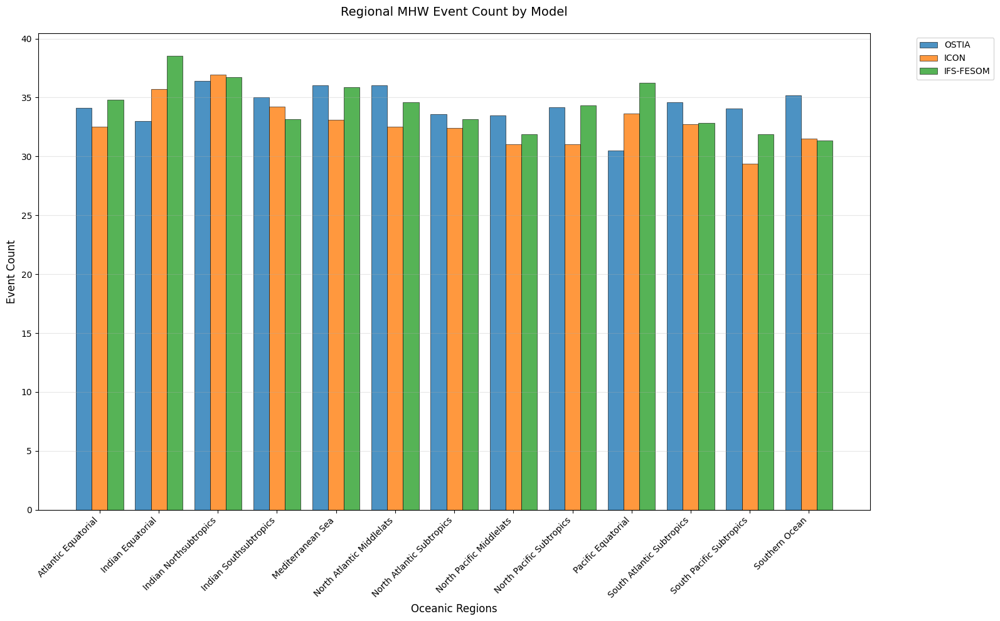

In [11]:
# Show ONLY the average number of events per region per model
mhw_events_dict, regional_mhw_data, masks_dict = selective_mhw_analysis(
    models_dict,
    plots_to_show=['regional_summary'],  # This will show just the event count barchart
    min_duration=5,
    max_gap=2
)

SELECTIVE MHW ANALYSIS - SHOWING ONLY SPECIFIED PLOTS
Plots to show: ['events_map']
QUICK MHW EVENTS ANALYSIS
COMPUTING MHW EVENTS FOR ALL MODELS
Processing OSTIA...
Creating MHW event dataset...
  Total events: 16190659
  Average duration: 11.9 days
Processing ICON...
Creating MHW event dataset...
  Total events: 15302523
  Average duration: 13.4 days
Processing IFS-FESOM...
Creating MHW event dataset...
  Total events: 15846317
  Average duration: 14.0 days
Creating model-specific masks...
Creating masks for OSTIA...
Loading existing masks for model grid (480,) x (1440,)...
  OSTIA grid: (480,) x (1440,)
  OSTIA regions: ['Atlantic_Equatorial', 'Indian_Equatorial', 'Indian_NorthSubTropics', 'Indian_SouthSubTropics', 'Mediterranean_Sea', 'North_Atlantic_MiddleLats', 'North_Atlantic_SubTropics', 'North_Pacific_MiddleLats', 'North_Pacific_SubTropics', 'Pacific_Equatorial', 'South_Atlantic_SubTropics', 'South_Pacific_SubTropics', 'Southern_Ocean']
Creating masks for ICON...
Loading exist

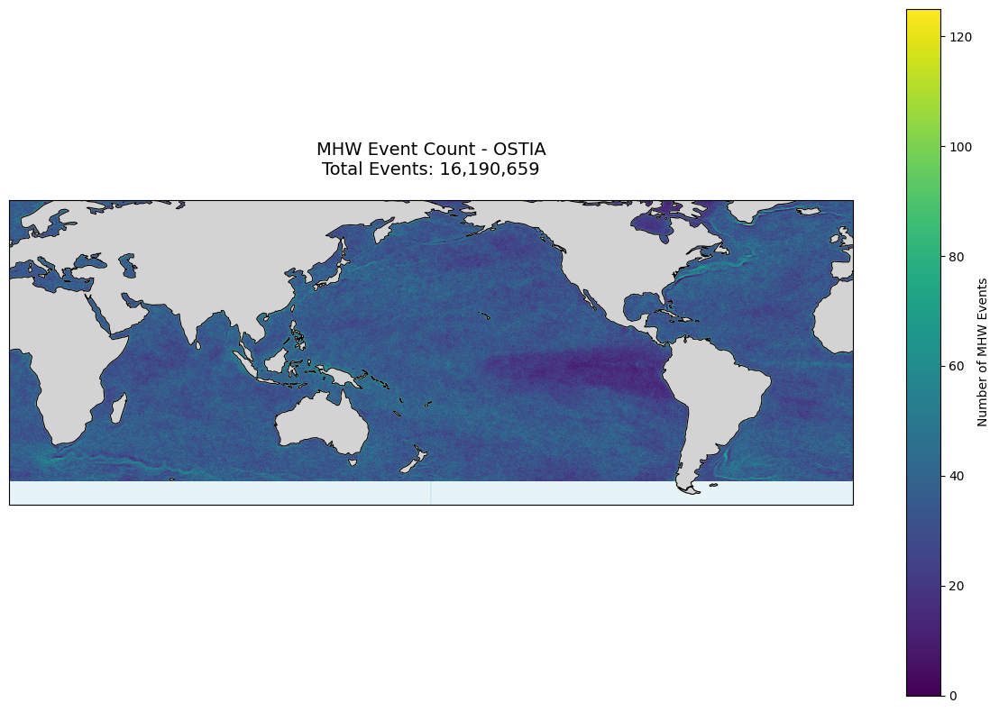

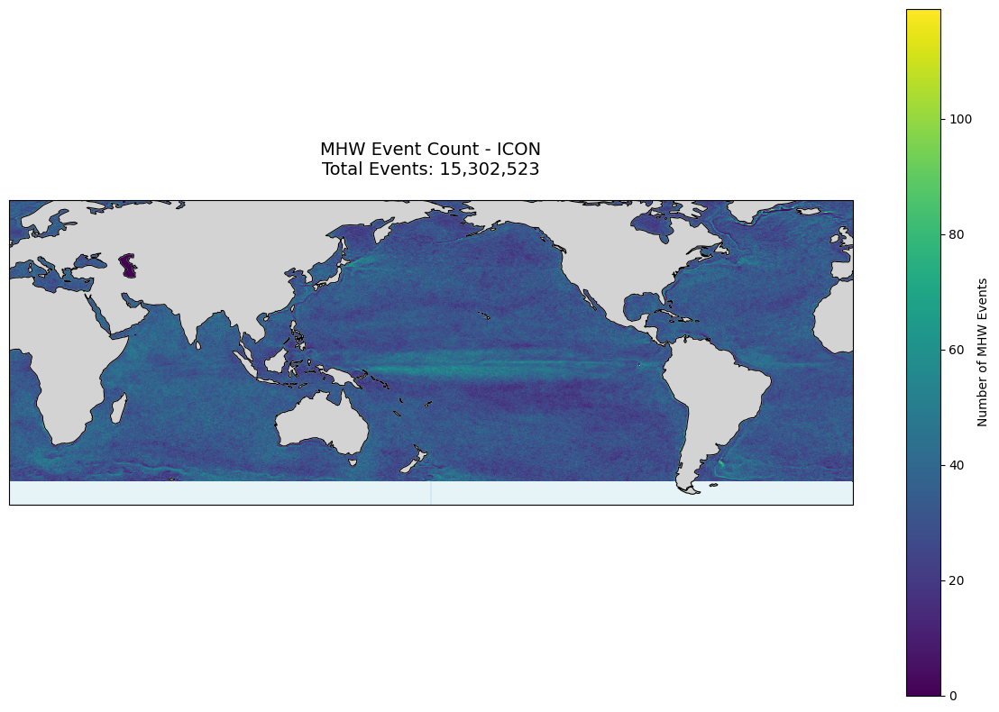

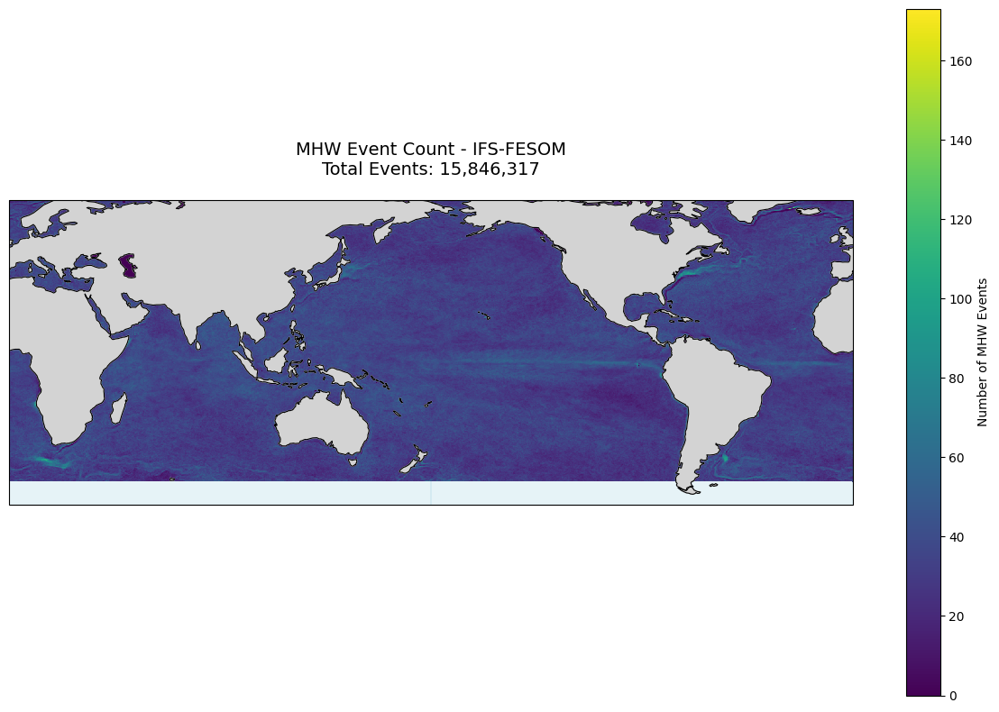

In [12]:
# Show only events map and regional summary
mhw_events_dict, regional_mhw_data, masks_dict = selective_mhw_analysis(
    models_dict,
    plots_to_show=['events_map'],
    min_duration=5,
    max_gap=2
)

In [ ]:
# Show only the comprehensive grid plot
mhw_events_dict, regional_mhw_data, masks_dict = selective_mhw_analysis(
    models_dict,
    plots_to_show=['regional_grid'],
    min_duration=5,
    max_gap=2
)

In [ ]:
# Show only the comprehensive grid plot
mhw_events_dict, regional_mhw_data, masks_dict = selective_mhw_analysis(
    models_dict,
    plots_to_show=['avg_duration'],
    min_duration=5,
    max_gap=2
)

In [9]:
# Print the function's docstring to see the available options
print(selective_mhw_analysis.__doc__)


    Wrapper for selective MHW analysis plotting
    
    Parameters:
    -----------
    models_dict : dict
        Dictionary with model names as keys and extreme events DataArrays as values
    plots_to_show : list
        List of plot types to show. Options:
        - 'events_map': MHW event count maps
        - 'duration_map': MHW average duration maps  
        - 'regional_events': Regional event count barchart
        - 'regional_duration': Regional duration barchart
        - 'regional_event_days': Regional total event days barchart
        - 'regional_grid': Regional comparison grid
        - 'regional_summary': Regional summary (the one you want)
    **kwargs : additional arguments passed to quick_mhw_events_analysis
    
    Returns:
    --------
    mhw_events_dict : dict
        Dictionary with MHW event datasets
    regional_mhw_data : dict
        Dictionary with regional MHW statistics
    masks_dict : dict
        Dictionary with model-specific masks
    


# MHW Intensity Plotting Functions

## Single Model Map Plots

### `plot_avg_intensity_map`
- **What it plots**: Average of event average intensities per grid cell
- **Default title**: "MHW average intensity of all average intensities"
- **Parameters**: 
  - `intensity_ds`: Intensity dataset
  - `model_name`: Model identifier
  - `figsize`: Figure dimensions
  - `central_longitude`: Map projection center
  - `vmin`, `vmax`: Color scale limits
  - `title`: Custom title (optional)

### `plot_avg_of_max_intensity_map`
- **What it plots**: Average of event maximum intensities per grid cell
- **Default title**: "MHW average intensity of all maximum intensities"
- **Parameters**: Same as above

### `plot_max_intensity_map`
- **What it plots**: Maximum of event maximum intensities per grid cell
- **Default title**: "MHW max intensity of all max intensities"
- **Parameters**: Same as above

## Multi-Model Comparison Plots

### `plot_multi_model_intensity_maps`
- **What it plots**: Grid of maps for multiple models
- **Parameters**:
  - `intensity_dict`: Dictionary of {model_name: intensity_ds}
  - `plot_type`: One of: `'avg_intensity'` (average of averages), `'avg_of_max_intensity'` (average of maxima), `'max_intensity'` (maxima of maxima)
  - `figsize`, `central_longitude`, `vmin`, `vmax`: Same as single plots
  - `titles`: Dictionary of custom titles per model

## Duration vs Intensity Relationship Plots

### `plot_duration_intensity_scatter`
- **What it plots**: 3 scatter plots (duration vs avg/max/median intensity)
- **Parameters**:
  - `mhw_events_ds`: MHW events dataset (contains durations)
  - `intensity_ds`: Intensity dataset
  - `model_name`: Model identifier
  - `max_points`: Maximum points to plot (for performance)
  - `figsize`: Figure dimensions

### `plot_duration_intensity_hist2d`
- **What it plots**: 3 density plots (2D histograms) of duration vs intensity
- **Parameters**: Same as scatter plots

## Convenience Functions

### `create_all_intensity_plots`
- **What it plots**: All plots for single or multiple models
- **Parameters**:
  - `mhw_events_dict`: Dictionary of {model_name: mhw_events_ds}
  - `intensity_dict`: Dictionary of {model_name: intensity_ds}
  - `model_names`: List of models to plot (optional)

In [9]:
o_ex=o_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
i_ex=i_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
f_ex=f_ex.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})


models_dict = {
    'OSTIA': o_ex,      # Your OSTIA extreme events data
    'ICON': i_ex,       # Your ICON extreme events data  
    'IFS-FESOM': f_ex   # Your IFS-FESOM extreme events data
}


In [10]:
# Your existing setup
o_mhws = create_mhw_event_dataset(o_ex, min_duration=5, max_gap=2, max_events_per_cell=100)
i_mhws = create_mhw_event_dataset(i_ex, min_duration=5, max_gap=2, max_events_per_cell=100)  
f_mhws = create_mhw_event_dataset(f_ex, min_duration=5, max_gap=2, max_events_per_cell=100)

Creating MHW event dataset...
Creating MHW event dataset...
Creating MHW event dataset...


In [11]:
ossta=ossta.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
issta=issta.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})
fssta=fssta.chunk(chunks={'time': -1, 'lat': 50, 'lon': 50})


models_ssta= {
    'OSTIA': ossta,     
    'ICON': issta,      
    'IFS-FESOM': fssta  
}

In [12]:

o_intensity = compute_event_intensity_vectorized(o_mhws, ossta)


Computing MHW intensity statistics (vectorized Dask approach)...
Processing grid: 480 x 1440 x 100 events
Applying vectorized computation...


In [13]:

i_intensity = compute_event_intensity_vectorized(i_mhws, issta)


Computing MHW intensity statistics (vectorized Dask approach)...
Processing grid: 481 x 1440 x 100 events
Applying vectorized computation...


In [14]:

f_intensity = compute_event_intensity_vectorized(f_mhws, fssta)


Computing MHW intensity statistics (vectorized Dask approach)...
Processing grid: 481 x 1440 x 100 events
Applying vectorized computation...


Creating intensity visualizations for OSTIA...
Creating all intensity plots for OSTIA...
Plotting average intensity map...


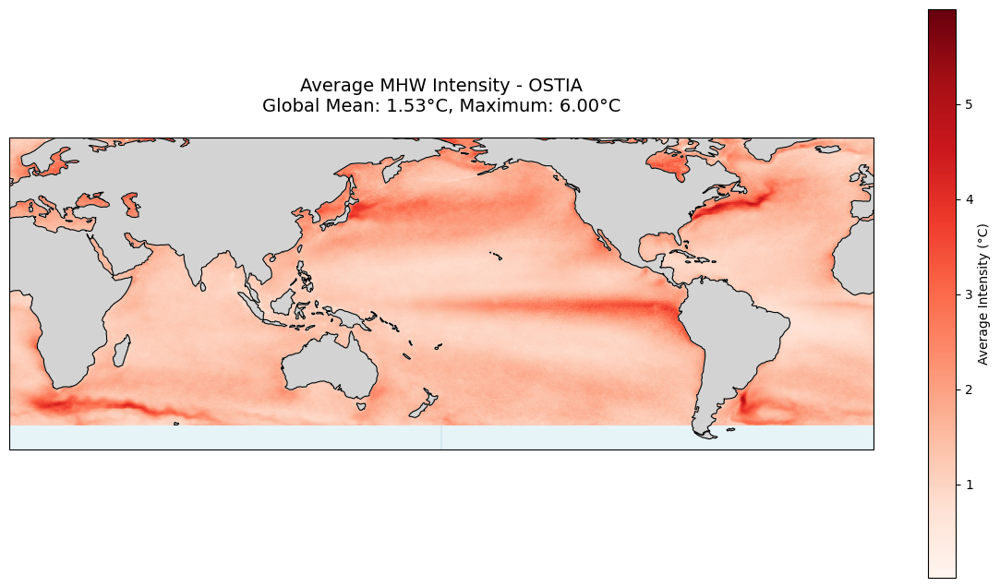

Plotting maximum intensity map...


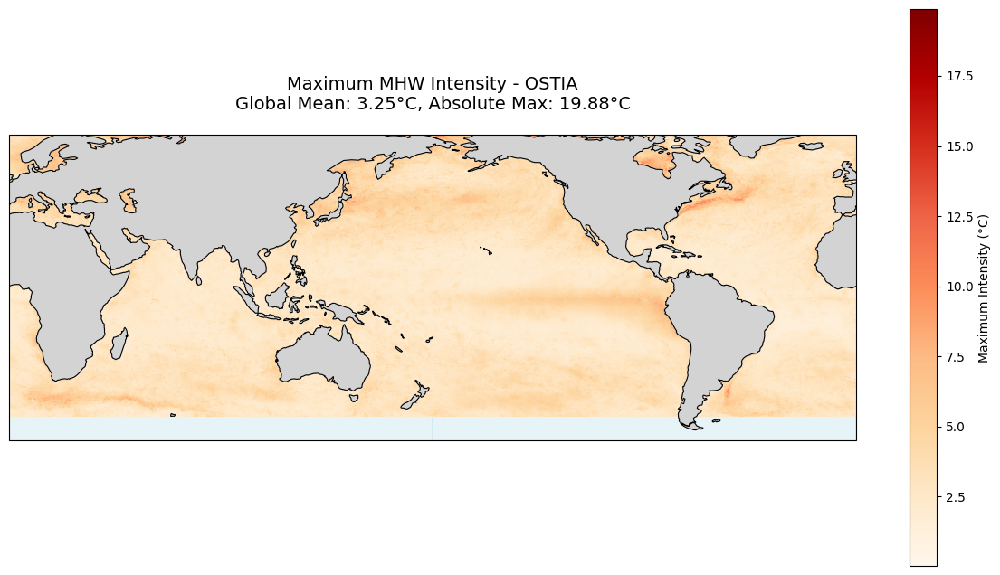

Creating duration vs intensity scatter plots...
  Flattening data and removing NaNs...


2025-11-24 15:40:10,197 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 5.16 GiB -- Worker memory limit: 7.36 GiB
2025-11-24 15:40:11,158 - distributed.worker.memory - WARNING - Worker is at 88% memory usage. Pausing worker.  Process memory: 6.53 GiB -- Worker memory limit: 7.36 GiB
2025-11-24 15:40:11,974 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:35539
Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/comm/tcp.py", line 228, in read
    frames_nosplit = await read_bytes_rw(stream, frames_nosplit_nbytes)
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/comm/tcp.py", line 367, in read_bytes_rw
    actual = await stream.read_into

  Valid data points: 16160333
  Sampling 10000 points for clarity...


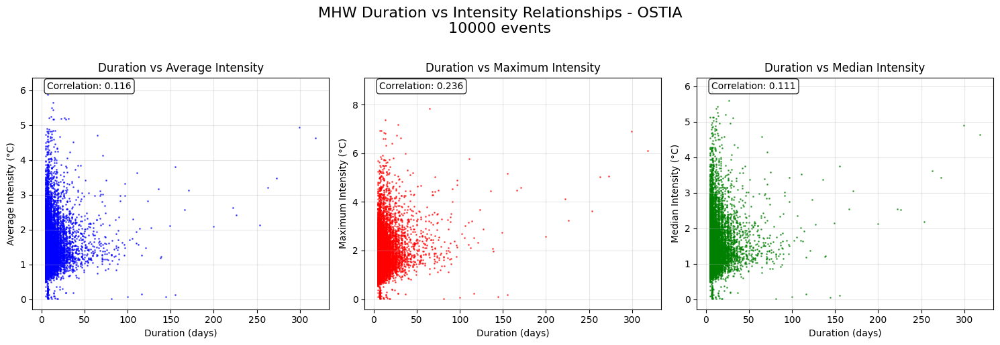

Creating duration vs intensity 2D histograms...
  Flattening data and removing NaNs...


2025-11-24 15:48:07,899 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:40063
Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/comm/tcp.py", line 226, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/worker.py", line 2075, in gather_dep
    response = await get_data_from_worker(
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/worker.py", line 2881, in get_data_from_worker
    response = await send_recv(
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/core.py", line 1018, in send_recv
    response = await comm.read(deserializers=deserializers)
  File "/home/b/b382616/.local/lib/python3.10/sit

  Valid data points: 16160333


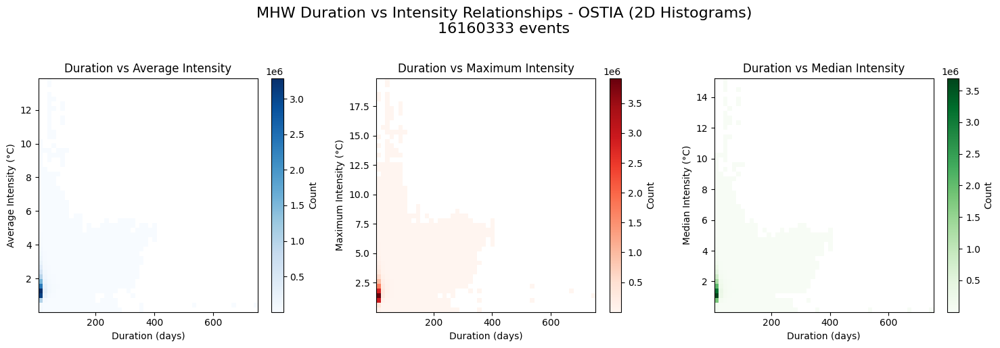

(<Figure size 1200x800 with 2 Axes>,
 <Figure size 1200x800 with 2 Axes>,
 <Figure size 1500x500 with 3 Axes>,
 <Figure size 1500x500 with 6 Axes>)

In [48]:
# Quick test with your data
print("Creating intensity visualizations for OSTIA...")
create_all_intensity_plots(o_mhws, o_intensity, "OSTIA")

Plotting average intensity map...


2025-11-24 16:16:38,543 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 4.48 GiB -- Worker memory limit: 7.36 GiB
2025-11-24 16:16:46,056 - distributed.worker - ERROR - Worker stream died during communication: tcp://127.0.0.1:39449
Traceback (most recent call last):
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/comm/tcp.py", line 228, in read
    frames_nosplit = await read_bytes_rw(stream, frames_nosplit_nbytes)
  File "/home/b/b382616/.local/lib/python3.10/site-packages/distributed/comm/tcp.py", line 367, in read_bytes_rw
    actual = await stream.read_into(chunk)  # type: ignore[arg-type]
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (m

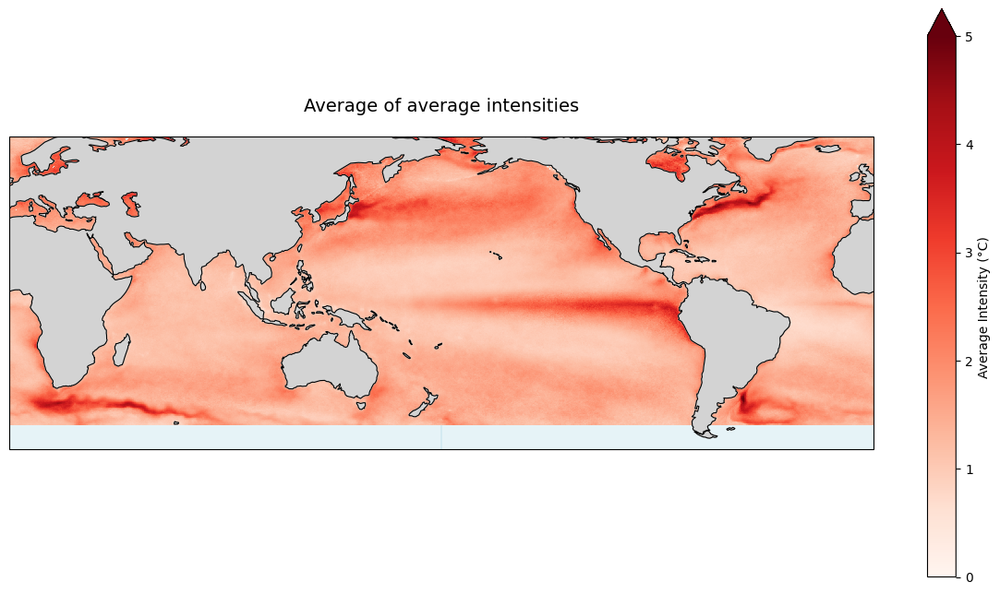

In [51]:
# Single model with custom vmin/vmax and title
fig, ax = plot_avg_intensity_map(o_intensity, "OSTIA", vmin=0, vmax=5, 
                                title="Average of average intensities")



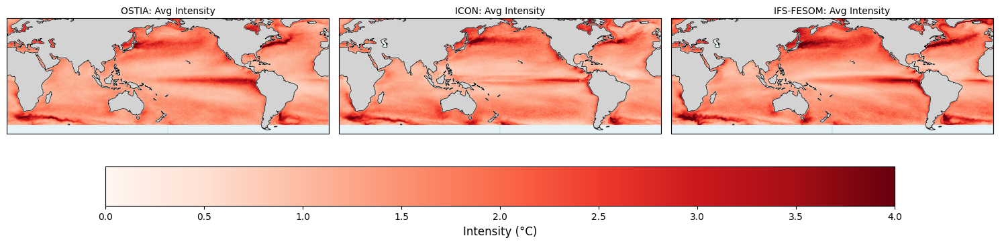

In [15]:
# Multiple models
intensity_dict = {
    'OSTIA': o_intensity,
    'ICON': i_intensity, 
    'IFS-FESOM': f_intensity
}

# Plot average intensity for all models with consistent color scale
fig, axes = plot_multi_model_intensity_maps(
    intensity_dict, 
    plot_type='avg_intensity',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Avg Intensity',
        'ICON': 'ICON: Avg Intensity', 
        'IFS-FESOM': 'IFS-FESOM: Avg Intensity'
    }
)

In [ ]:

# Plot average intensity for all models with consistent color scale
fig, axes = plot_multi_model_intensity_maps(
    intensity_dict, 
    plot_type='max_intensity',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Avg Intensity',
        'ICON': 'ICON: Avg Intensity', 
        'IFS-FESOM': 'IFS-FESOM: Avg Intensity'
    }
)

In [ ]:

# Plot average intensity for all models with consistent color scale
fig, axes = plot_multi_model_intensity_maps(
    intensity_dict, 
    plot_type='avg_of_max_intensity',
    vmin=0, vmax=4,  # Consistent color scale across all models
    titles={
        'OSTIA': 'OSTIA: Avg Intensity',
        'ICON': 'ICON: Avg Intensity', 
        'IFS-FESOM': 'IFS-FESOM: Avg Intensity'
    }
)